In [1]:
from visual_genome.local import VisualGenome

### Loading the data

The data is loaded from the `json` files located in the `data/` directory. It may take a few minutes to load the data. Please make sure to run `setup.py` first to get all necessary `json` files.

In [2]:
vg = VisualGenome() # this may take a little while

Loading data...
Data loaded.


### Image Retrieval and Visualization

We can sample an `Image` object from the data and visualize it, or we can directly visualize a random image.


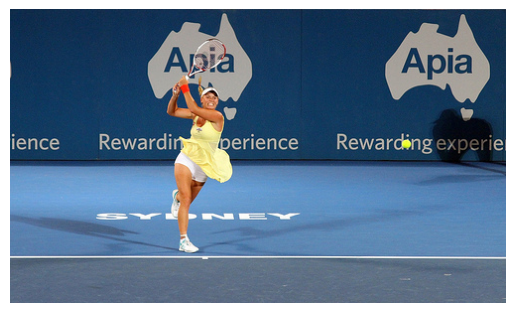

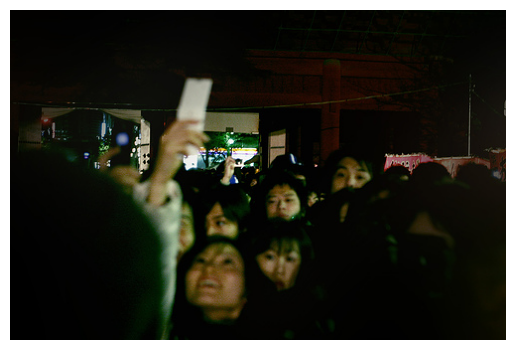

In [3]:
img = vg.sample_images() # sample single image - returns an IMAGE object (you can also sample a list of images by passing a number as an argument)
vg.display_image(img)

## or directly visualize a random image
vg.display_random_image()

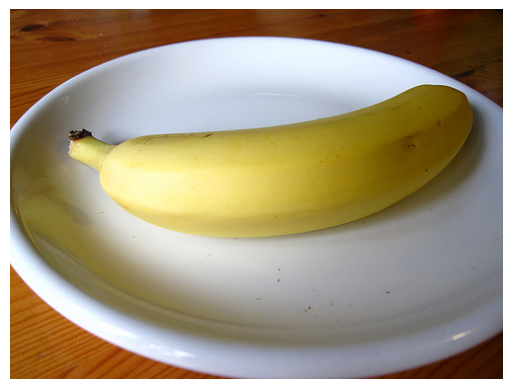

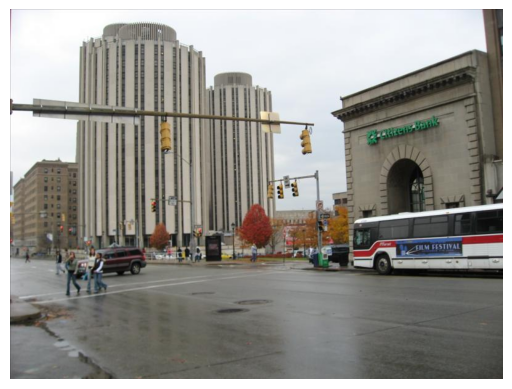

In [4]:
# You can sample an image ID as well
id = vg.sample_image_id()
vg.display_image(id)

# If you want, you can sample from a specific interval
id = vg.sample_image_id(start = 0, end = 1000)
vg.display_image(id)

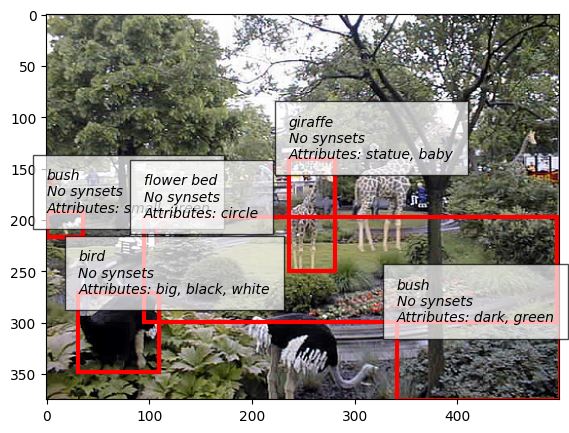

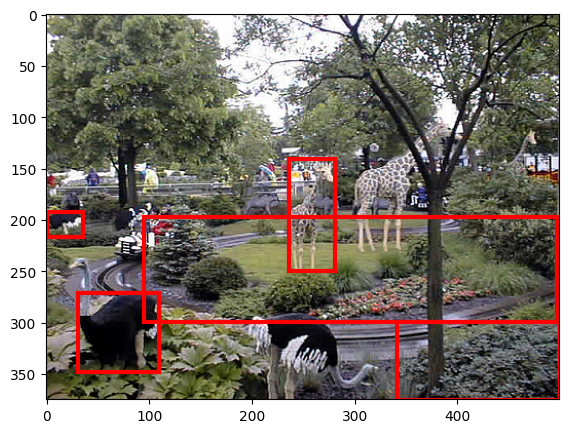

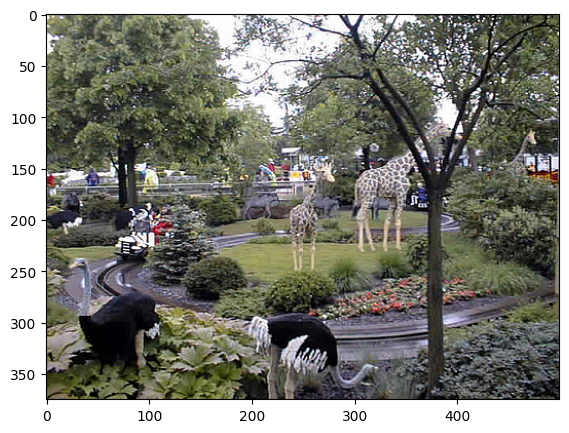

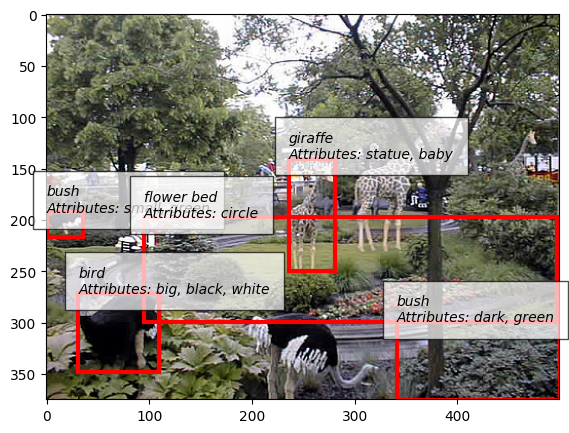

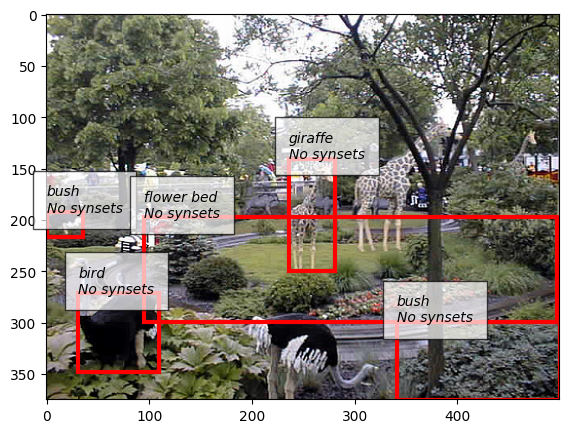

In [5]:
id = vg.sample_image_id()

# you can visualize the objects in an image, second parameter specifies the number of regions to visualize (avoid using large numbers for visibility)
vg.visualize_objects(id, 5)
# visualize without any description
vg.visualize_objects(id, 5, desc=False)
# visualize without objects
vg.visualize_objects(id, 0) # same as display_image(2408156)
# visualize without synsets
vg.visualize_objects(id, 5, synsets=False)
# visualize without attributes
vg.visualize_objects(id, 5, attributes=False)

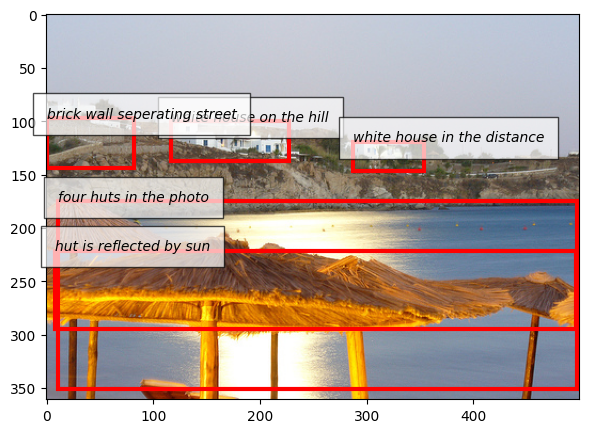

In [6]:
id = vg.sample_image_id()

# You can visualize regions as well, second parameter specifies the number of regions to visualize (avoid using large numbers for visibility)
vg.visualize_regions(id, 5)

### Scene Graph Generation

To visualize a scene graph, first we should call `generate_scene_graph_json` with the id of the image we want to visualize. It returns a `json` object that contains the scene graph of the image. Then we store the `json` object in the `graphviz` folder and call `graphviz/visualize_scene_graph.py` to render the scene graph.

In [7]:
id = vg.sample_image_id()
scene_graph = vg.generate_scene_graph_json(1)

import json
# save to graph.json
with open(f"graphviz/scene_graph.json", "w") as f:
    json.dump(scene_graph, f)

Now, generated scene graph is stored as a `json` file in the `graphviz` directory. You can visualize the scene graph by running the following code.

```bash
python graphviz/visualize_scene_graph.py
```


### Cluster Visualization

After creating the categories using `clustering.ipynb`, a resulting `csv` file is stored in the current directory. It consists of the following fields: `Image_id` , `region_sentences`, `embeddings`, `cluster`, `centroid`, `distance_from_centroid`. You can visualize sample images from a cluster side by side as follows. 

In [8]:
csv_file = "categories_all-mpnet-base-v2_30clusters.csv" # this is an example file, please change it according to yours
# read
import pandas as pd

df = pd.read_csv(csv_file)
df.head()

,Image_id,region_sentences,embeddings,cluster,centroid,distance_from_centroid
0,2392778,"['this is a tennis ball', 'the ball is green i...",[-6.78976486e-03 -1.92860588e-02 -9.38159321e-...,7,[-5.00519946e-03 -4.01747413e-02 -3.54179251e-...,0.268448
1,2350124,"['this is the sky', 'the sky is blue in color'...",[-4.51836130e-03 -2.10824944e-02 3.28454887e-...,0,[-7.26351188e-03 -1.38044683e-02 2.33668159e-...,0.190454
2,2331619,"['the sky is blue in color', 'this is the gras...",[ 1.32353343e-02 -2.58004647e-02 2.40336944e-...,12,[ 9.91439726e-03 -2.86525786e-02 -2.07444048e-...,0.244271
3,1568,"['man walking on sidewalk', 'parking meter nex...",[-1.31078735e-02 -9.91888158e-03 1.79395415e-...,24,[-8.10696837e-03 -1.30533958e-02 7.94926845e-...,0.242323
4,2351423,"['a banana on a table', 'a banana laying flat'...",[ 5.93260378e-02 -5.12463748e-02 -2.40512062e-...,19,[ 2.38962304e-02 -3.09554804e-02 -6.30281586e-...,0.558043


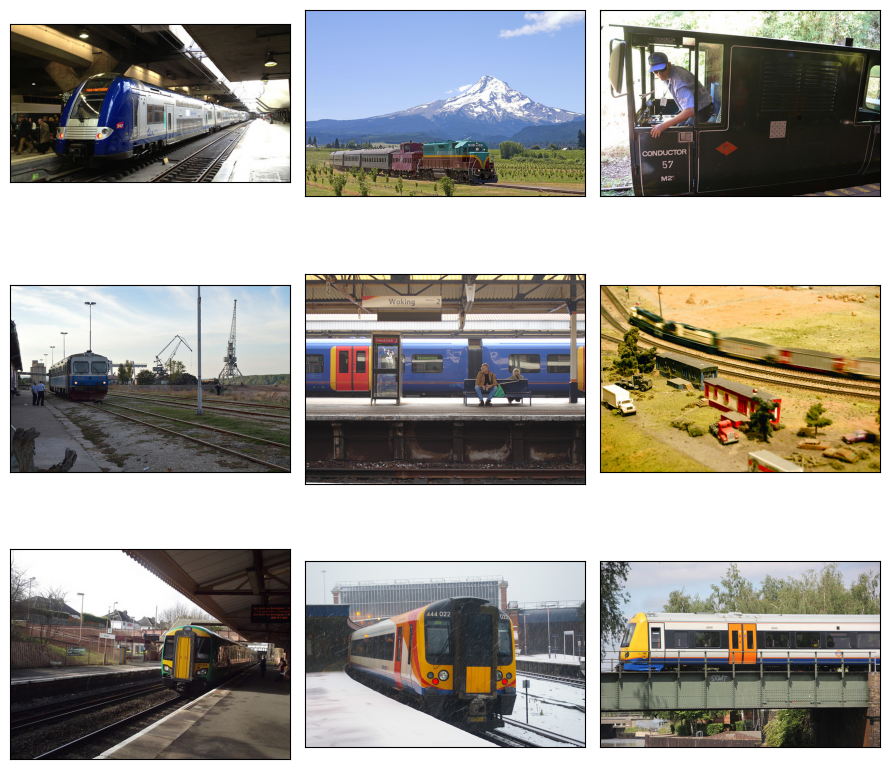

In [10]:
vg.visualize_cluster(df = df, cluster = 0, n = 3) # visualizes n x n grid of images from the given cluster

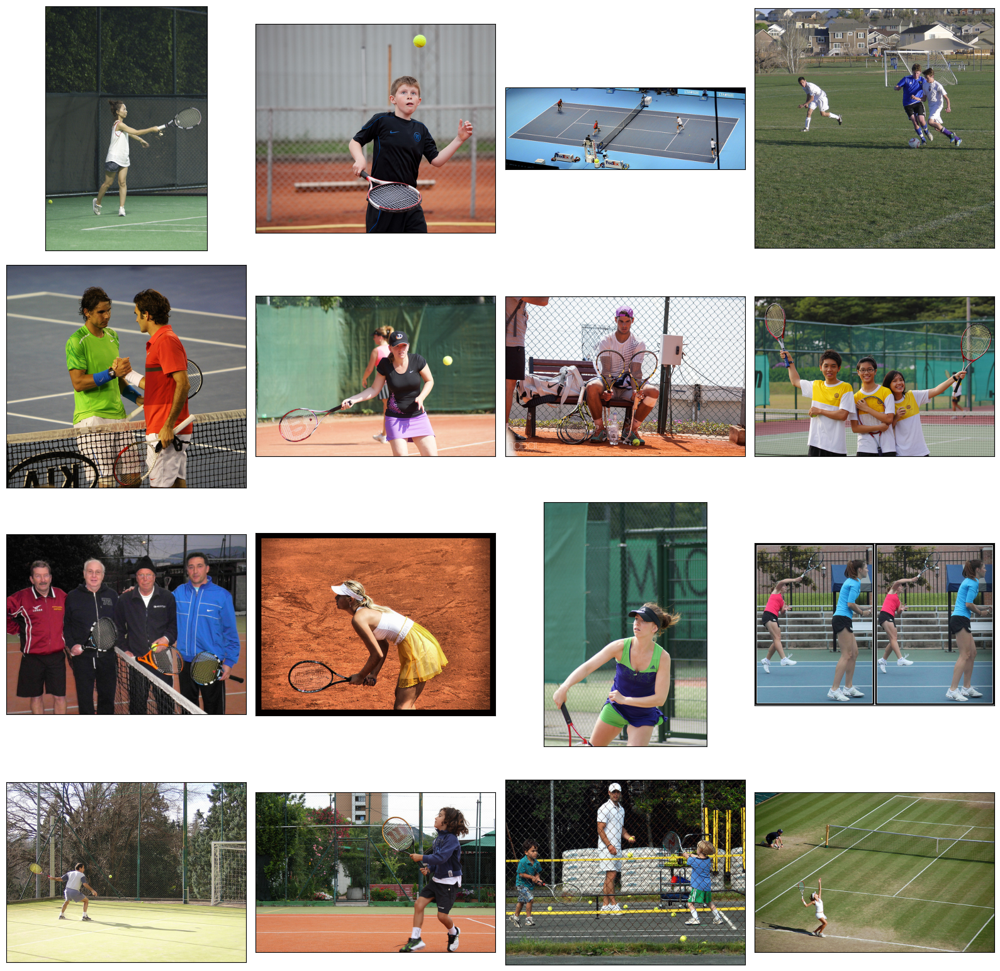

In [12]:
vg.visualize_cluster(df = df, cluster = 7, n = 4)